# Data Exploration and Preprocessing

In [1]:
#importing the dependencies
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# helpful character encoding module
import chardet
# look at the first ten thousand bytes to guess the character encoding  of the csv file
with open(r"C:\Users\HP\Documents\cognifyz\Dataset .csv", 'rb') as rawdata:
    result = chardet.detect(rawdata.read(10000))

# check what the character encoding might be
print(result)

{'encoding': 'UTF-8-SIG', 'confidence': 1.0, 'language': ''}


In [3]:
# So chardet is 100% confident that the right encoding is "UTF-8-SIG". Let's see if that's correct:

In [4]:
# read in the file with the encoding detected by chardet
Restaurant_enterprise_data= pd.read_csv(r"C:\Users\HP\Documents\cognifyz\Dataset .csv", encoding='UTF-8-SIG')

# look at the first few lines
Restaurant_enterprise_data.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [5]:
print(Restaurant_enterprise_data.dtypes)
#The data types appear appropriate for the columns, with numerical values correctly identified as integers or floats, and categorical data as objects.

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


In [6]:
Restaurant_enterprise_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [7]:
#DATA SIZE
Restaurant_enterprise_data.shape

(9551, 21)

In [8]:
# Check for any missing values in the dataset
missing_values = Restaurant_enterprise_data.isnull().sum()

# Display the missing values count
print(missing_values)

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [9]:
Restaurant_enterprise_data['Restaurant Name'].unique()

array(['Le Petit Souffle', 'Izakaya Kikufuji', 'Heat - Edsa Shangri-La',
       ..., 'Huqqa', 'A���k Kahve', "Walter's Coffee Roastery"],
      dtype=object)

In [10]:
Restaurant_enterprise_data['Restaurant Name'].value_counts()

Cafe Coffee Day             83
Domino's Pizza              79
Subway                      63
Green Chick Chop            51
McDonald's                  48
                            ..
Odeon Social                 1
Johnny Rockets               1
House of Commons             1
HotMess                      1
Walter's Coffee Roastery     1
Name: Restaurant Name, Length: 7446, dtype: int64

In [11]:
Restaurant_enterprise_data['City'].value_counts()

New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: City, Length: 141, dtype: int64

In [12]:
Restaurant_enterprise_data.value_counts()

Restaurant ID  Restaurant Name     Country Code  City       Address                                                              Locality                   Locality Verbose                      Longitude  Latitude   Cuisines                                  Average Cost for two  Currency            Has Table booking  Has Online delivery  Is delivering now  Switch to order menu  Price range  Aggregate rating  Rating color  Rating text  Votes
53             Amber               1             New Delhi  N-19, Connaught Place, New Delhi                                     Connaught Place            Connaught Place, New Delhi            77.220891  28.630197  North Indian, Chinese, Mughlai            1800                  Indian Rupees(Rs.)  Yes                Yes                  No                 No                    3            2.6               Orange        Average      152      1
18264996       Kream's             1             New Delhi  Shop 6, D-121, Vikaspuri, New Delhi          

In [13]:
# unique value shows 9542 while shape shows 9551,,, so Total missing values in the DataFrame
total_missing = Restaurant_enterprise_data.isnull().sum().sum()
print(f"Total missing values: {total_missing}")

Total missing values: 9


In [14]:
# Rows with any missing values
rows_with_missing = Restaurant_enterprise_data[Restaurant_enterprise_data.isnull().any(axis=1)]
print(rows_with_missing)

     Restaurant ID                 Restaurant Name  Country Code  \
84        17284105                   Cookie Shoppe           216   
87        17284211  Pearly's Famous Country Cookng           216   
94        17284158               Jimmie's Hot Dogs           216   
297       17374552                  Corkscrew Cafe           216   
328       17501439                        Dovetail           216   
346       17606621            HI Lite Bar & Lounge           216   
368       17059060                       Hillstone           216   
418       17142698                Leonard's Bakery           216   
455       17616465        Tybee Island Social Club           216   

               City                                          Address  \
84           Albany               115 N Jackson St, Albany, GA 31701   
87           Albany             814 N Slappey Blvd, Albany, GA 31701   
94           Albany               204 S Jackson St, Albany, GA 31701   
297     Gainesville            

In [15]:
# Fill missing values in the 'Cuisines' column with 'Not Specified'
Restaurant_enterprise_data['Cuisines'].fillna('Not Specified', inplace=True)

# Verify that there are no more missing values
missing_values_after = Restaurant_enterprise_data.isnull().sum()
print(missing_values_after)

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [16]:
# Check for duplicate entries in the dataset
duplicates = Restaurant_enterprise_data.duplicated().sum()

# Display the number of duplicate entries
print('Number of duplicate entries:', duplicates)

Number of duplicate entries: 0


In [17]:
Restaurant_enterprise_data.shape

(9551, 21)

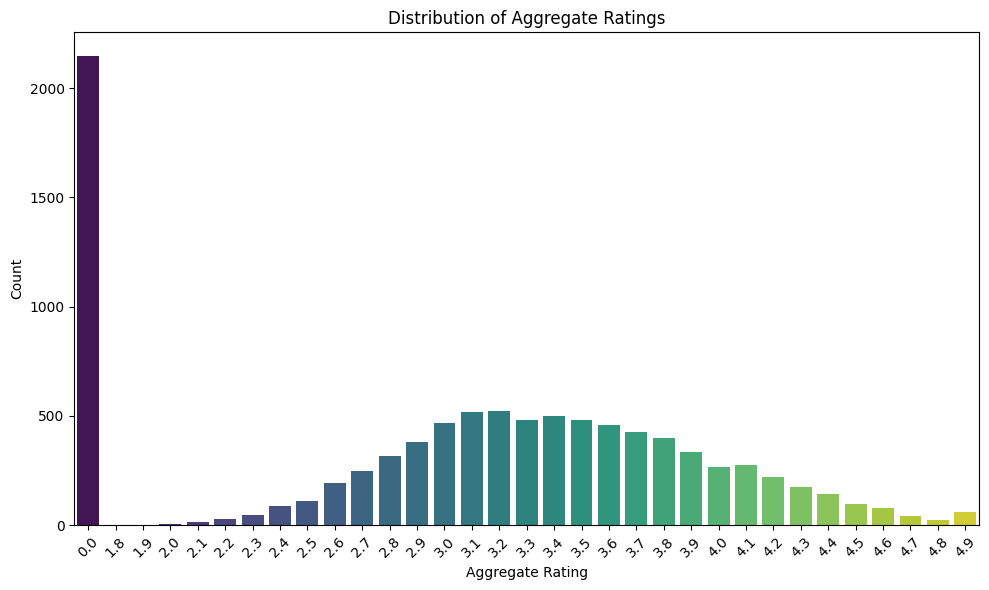

In [18]:
#Distribution of target variable(average rating)
# Analyze the distribution of the target variable 'Aggregate rating'

# Create a count plot to visualize the distribution of Aggregate Ratings
plt.figure(figsize=(10, 6))

# Count plot for Aggregate Rating
sns.countplot(x='Aggregate rating', data=Restaurant_enterprise_data, palette='viridis')
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [19]:
# Calculate the percentage of each Aggregate Rating class
rating_counts = Restaurant_enterprise_data['Aggregate rating'].value_counts(normalize=True) * 100

# Convert to DataFrame for better visualization
rating_distribution = rating_counts.reset_index()
rating_distribution.columns = ['Aggregate Rating', 'Percentage']

# Display the rating distribution
print(rating_distribution)

    Aggregate Rating  Percentage
0                0.0   22.489792
1                3.2    5.465396
2                3.1    5.433986
3                3.4    5.214114
4                3.3    5.057062
5                3.5    5.025652
6                3.0    4.900010
7                3.6    4.795309
8                3.7    4.470736
9                3.8    4.188043
10               2.9    3.989111
11               3.9    3.507486
12               2.8    3.298084
13               4.1    2.868810
14               4.0    2.785049
15               2.7    2.617527
16               4.2    2.313894
17               2.6    1.999791
18               4.3    1.821799
19               4.4    1.507696
20               2.5    1.151712
21               4.5    0.994660
22               2.4    0.910899
23               4.6    0.816668
24               4.9    0.638677
25               2.3    0.492095
26               4.7    0.439745
27               2.2    0.282693
28               4.8    0.261753
29        

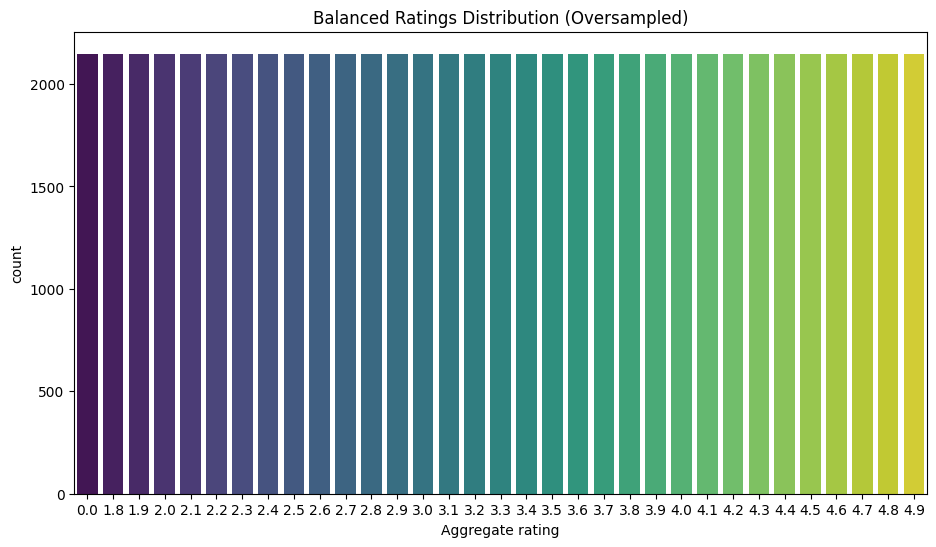

In [20]:
#The most frequent rating is 0.0, which constitutes approximately 22.49% of the dataset,
#while higher ratings have significantly lower frequencies.....therefore oversample the smallest classes

from sklearn.utils import resample

# Determine the maximum count
max_count = Restaurant_enterprise_data['Aggregate rating'].value_counts().max()

# Oversample each category to match the largest class
Restaurant_enterprise_data_balanced = pd.DataFrame()
for category in Restaurant_enterprise_data['Aggregate rating'].unique():
    category_data = Restaurant_enterprise_data[Restaurant_enterprise_data['Aggregate rating'] == category]
    category_oversampled = resample(category_data,
                                    replace=True,
                                    n_samples=max_count,
                                    random_state=42)
    Restaurant_enterprise_data_balanced = pd.concat([Restaurant_enterprise_data_balanced, category_oversampled])

# Create a count plot to visualize the distribution of Aggregate Ratings
plt.figure(figsize=(11, 6))

# Plot the balanced data
sns.countplot(x='Aggregate rating', data=Restaurant_enterprise_data_balanced, palette='viridis')
plt.title('Balanced Ratings Distribution (Oversampled)')
plt.show()


# Descriptive Analysis. Level 1(Task2)

In [21]:
#performing exploratory data analysis (EDA) to gain insights into the dataset, such as summary statistics for numerical columns 
#and visualizations of key features
# Generate summary statistics for the numerical columns
summary_statistics = Restaurant_enterprise_data.describe()

# Display the summary statistics
print(summary_statistics)

       Restaurant ID  Country Code    Longitude     Latitude  \
count   9.551000e+03   9551.000000  9551.000000  9551.000000   
mean    9.051128e+06     18.365616    64.126574    25.854381   
std     8.791521e+06     56.750546    41.467058    11.007935   
min     5.300000e+01      1.000000  -157.948486   -41.330428   
25%     3.019625e+05      1.000000    77.081343    28.478713   
50%     6.004089e+06      1.000000    77.191964    28.570469   
75%     1.835229e+07      1.000000    77.282006    28.642758   
max     1.850065e+07    216.000000   174.832089    55.976980   

       Average Cost for two  Price range  Aggregate rating         Votes  
count           9551.000000  9551.000000       9551.000000   9551.000000  
mean            1199.210763     1.804837          2.666370    156.909748  
std            16121.183073     0.905609          1.516378    430.169145  
min                0.000000     1.000000          0.000000      0.000000  
25%              250.000000     1.000000        

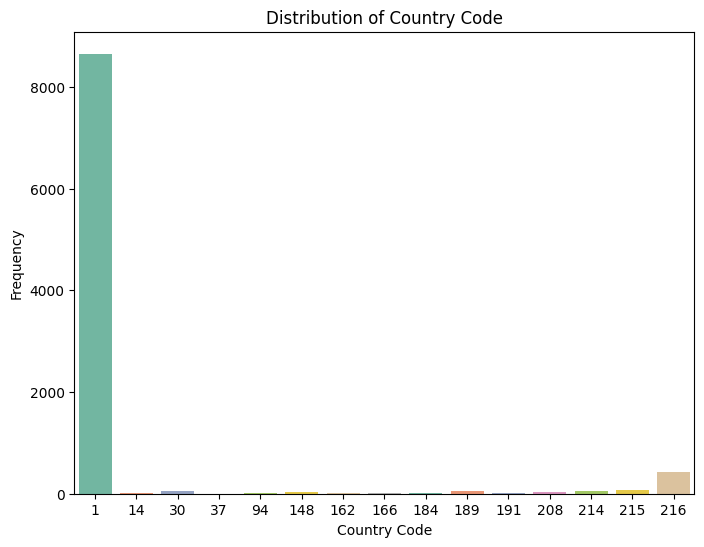

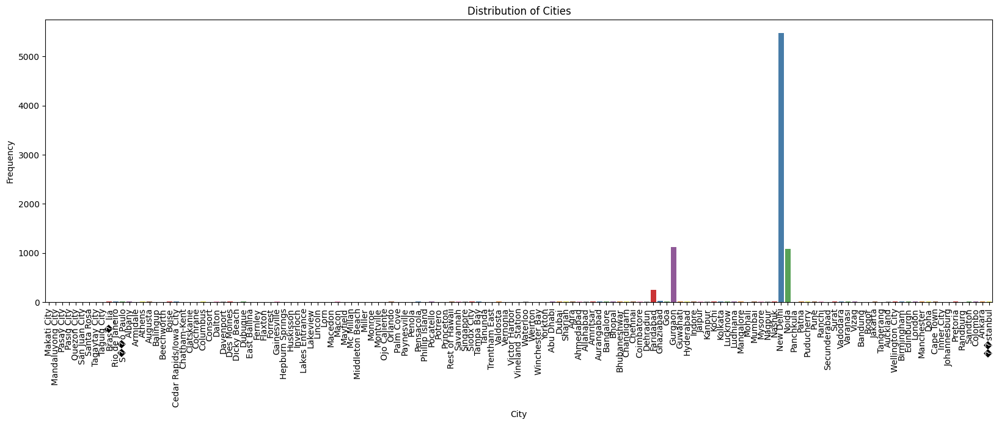

In [22]:
# Seaborn plot for Country Code distribution
plt.figure(figsize=(8, 6))
sns.countplot(data=Restaurant_enterprise_data, x='Country Code', palette='Set2')
plt.title('Distribution of Country Code')
plt.xlabel('Country Code')
plt.ylabel('Frequency')
plt.show()

# Seaborn plot for City distribution
plt.figure(figsize=(20, 6))
sns.countplot(data=Restaurant_enterprise_data, x='City', palette='Set1')
plt.title('Distribution of Cities')
plt.xlabel('City')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.show()

# Seaborn plot for Cuisines distribution
#plt.figure(figsize=(20, 6))
#sns.countplot(data=Restaurant_enterprise_data, x='Cuisines', palette='muted')
#plt.title('Distribution of Cuisines')
#plt.xlabel('Cuisine')
#plt.ylabel('Frequency')
#plt.xticks(rotation=90)
#plt.show()

In [23]:
#top cuisines and city with the highest number of restaurants.

In [24]:
if 'Cuisines' in Restaurant_enterprise_data.columns:
    # Split the cuisines for restaurants with multiple entries and explode them
   
    Restaurant_enterprise_data_cuisines = Restaurant_enterprise_data['Cuisines'].str.split(',').explode().str.strip()

    # Count occurrences of each cuisine
    cuisine_counts = Restaurant_enterprise_data_cuisines.value_counts()
cuisine_counts    

North Indian      3960
Chinese           2735
Fast Food         1986
Mughlai            995
Italian            764
                  ... 
Fish and Chips       1
Malwani              1
Cuisine Varies       1
Soul Food            1
B�_rek               1
Name: Cuisines, Length: 146, dtype: int64

In [25]:
Restaurant_enterprise_data['City'].value_counts()

New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: City, Length: 141, dtype: int64

# Geospatial Analysis for Restaurant. Level 1(Task3)

In [26]:
import folium

# Initialize the map centered around an average location
map_center = [Restaurant_enterprise_data['Latitude'].mean(), Restaurant_enterprise_data['Longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=2)

# Add markers for each restaurant
for index, row in Restaurant_enterprise_data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} - {row['City']}",
        icon=folium.Icon(color='blue')
    ).add_to(mymap)

# Save the map as an HTML file or display it
mymap.save('restaurant_locations.html')

In [27]:
mymap

In [28]:
#Analyzing the distribution of restaurants across different cities or countries. 
#Determine if there is any correlation between the restaurant's location and its rating.

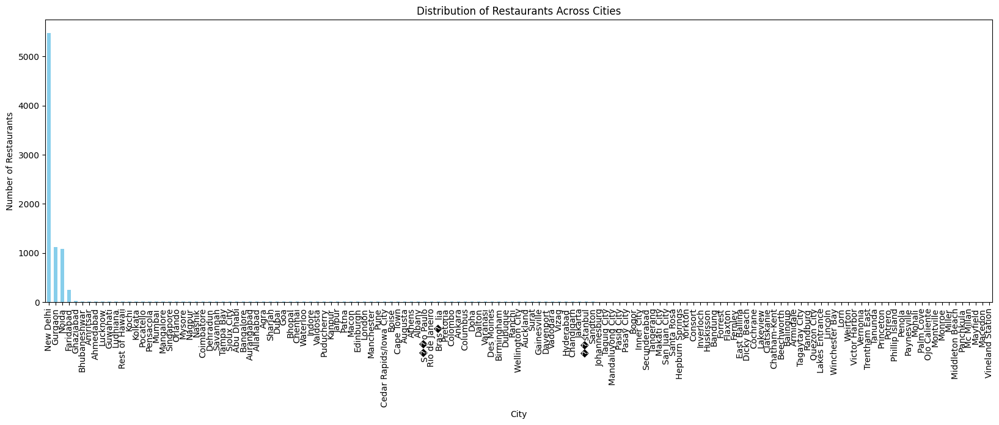

In [29]:
# Distribution of restaurants across cities
city_dist = Restaurant_enterprise_data['City'].value_counts()

# Plotting the distribution
plt.figure(figsize=(20, 6))
city_dist.plot(kind='bar', color='skyblue')
plt.title('Distribution of Restaurants Across Cities')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=90)
plt.show()

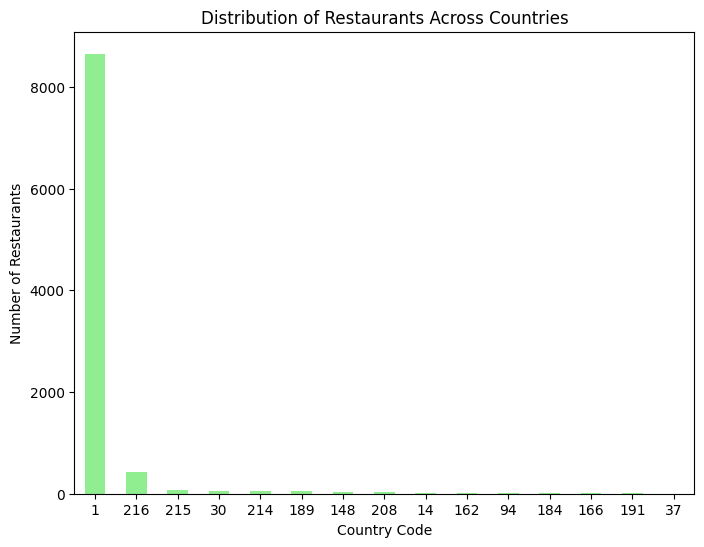

In [30]:
# Distribution of restaurants across countries
country_dist = Restaurant_enterprise_data['Country Code'].value_counts()

# Plotting the distribution
plt.figure(figsize=(8, 6))
country_dist.plot(kind='bar', color='lightgreen')
plt.title('Distribution of Restaurants Across Countries')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=0)
plt.show()


In [31]:
#Analyzing the Correlation Between Location and Rating
#explore if there is any relationship between a restaurant’s location (latitude and longitude) and its rating.
#we"ll first explore Scatter Plot Between Latitude/Longitude and Rating

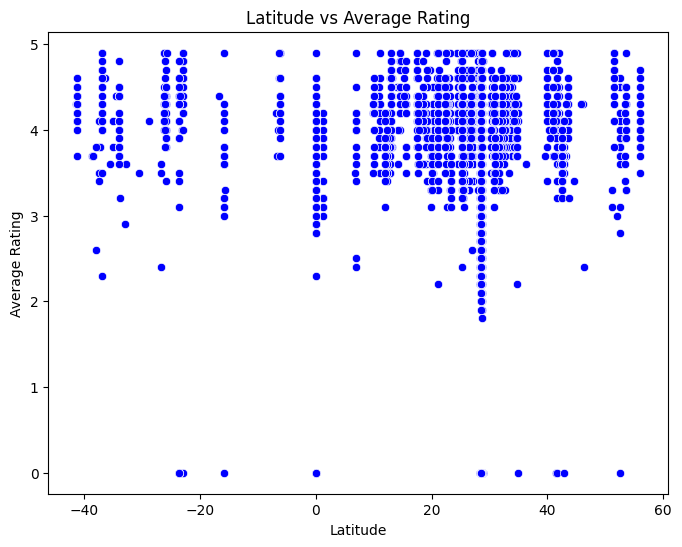

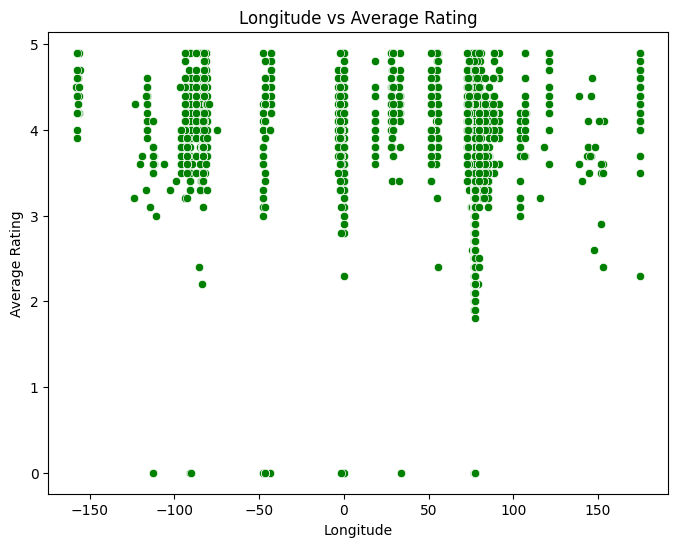

In [32]:
import seaborn as sns

# Scatter plot for Latitude vs Average Rating
plt.figure(figsize=(8, 6))
sns.scatterplot(data=Restaurant_enterprise_data, x='Latitude', y='Aggregate rating', color='blue')
plt.title('Latitude vs Average Rating')
plt.xlabel('Latitude')
plt.ylabel('Average Rating')
plt.show()

# Scatter plot for Longitude vs Average Rating
plt.figure(figsize=(8, 6))
sns.scatterplot(data=Restaurant_enterprise_data, x='Longitude', y='Aggregate rating', color='green')
plt.title('Longitude vs Average Rating')
plt.xlabel('Longitude')
plt.ylabel('Average Rating')
plt.show()


In [33]:
# Calculate correlation coefficients
correlation_latitude = Restaurant_enterprise_data[['Latitude', 'Aggregate rating']].corr().iloc[0, 1]
correlation_longitude = Restaurant_enterprise_data[['Longitude', 'Aggregate rating']].corr().iloc[0, 1]

print(f"Correlation between Latitude and Aggregate rating: {correlation_latitude}")
print(f"Correlation between Longitude and Aggregate rating: {correlation_longitude}")

Correlation between Latitude and Aggregate rating: 0.0005155806902363053
Correlation between Longitude and Aggregate rating: -0.11681757734540295


C:\Users\HP\AppData\Local\Temp\ipykernel_7948\200376652.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(Restaurant_enterprise_data.corr(), annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)


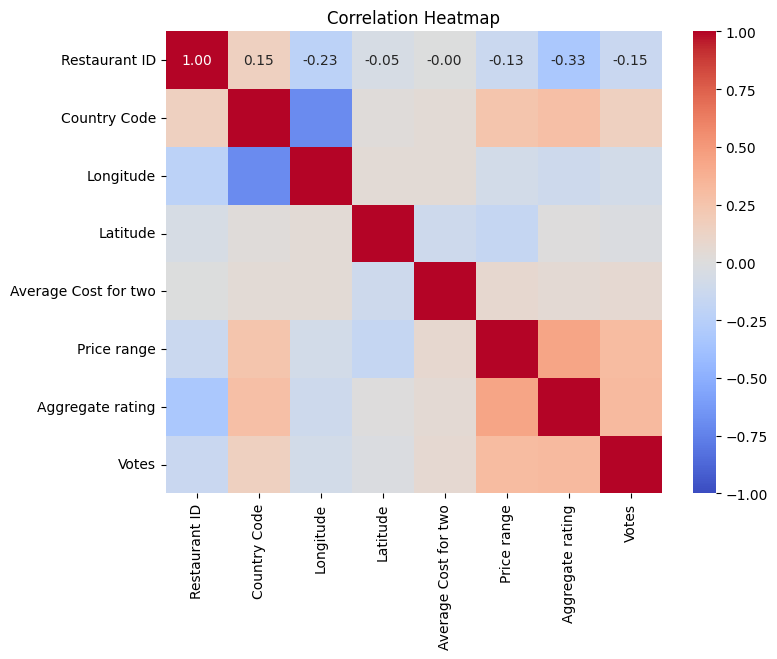

In [34]:
# Heatmap for correlation of numeric columns
plt.figure(figsize=(8, 6))
sns.heatmap(Restaurant_enterprise_data.corr(), annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()